In [1]:
%load_ext autoreload
%autoreload 2
import uproot
import numpy as np
import matplotlib.pyplot as plt
import awkward as ak
import sys
sys.path.append("../../../analysisTools/")
from analysisTools import Analyzer
from analysisTools import loadSchema
import analysisTools as tools
import analysisSubroutines as routines
import plotTools as ptools
import utils
import importlib
import coffea.util as util
import time
import json
import os
import glob
import pandas as pd
import mplhep as hep

### Import coffea files

In [2]:
prefix = './coffea/'
suffix = '_collinear3D'

In [3]:
bkg_histo = util.load(f'{prefix}/background_VR{suffix}.coffea')[0]

In [4]:
data_histo = util.load(f'{prefix}/data_VR{suffix}.coffea')[0]

In [5]:
sig_histo = util.load(f'{prefix}/signal_VR{suffix}.coffea')[0]

In [6]:
utils.get_signal_list_of_cuts(sig_histo)

['Preselections',
 'n(good vertex) > 0',
 'computing BDT score',
 'No b-tagged jets',
 'Leading jet |eta| < 2.4',
 'Leading jet pT > 80 GeV',
 'dPhi(MET,leading jet) > 2',
 'dPhi(MET,all jets) > 0.75',
 'Vtx CosCollinear3D < 0']

### Efficiency

In [7]:
df_signal = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')
df_signal

,Preselections,n(good vertex) > 0,computing BDT score,No b-tagged jets,Leading jet |eta| < 2.4,Leading jet pT > 80 GeV,"dPhi(MET,leading jet) > 2","dPhi(MET,all jets) > 0.75",Vtx CosCollinear3D < 0
sig_2018_Mchi-99p0_dMchi-18p0_ctau-100,0.163943,0.058991,0.058991,0.050803,0.049132,0.049118,0.049118,0.048679,0.008936
sig_2018_Mchi-94p5_dMchi-9p0_ctau-100,4.431276,1.438000,1.438000,1.238390,1.212721,1.212721,1.212721,1.201397,0.178638
sig_2018_Mchi-99p0_dMchi-18p0_ctau-10,3.368019,1.720328,1.720328,1.487693,1.451764,1.451464,1.451464,1.437994,0.415440
sig_2018_Mchi-99p0_dMchi-18p0_ctau-1,43.307033,16.375157,16.375157,14.115822,13.733015,13.720565,13.720565,13.608584,5.895404
sig_2018_Mchi-88p0_dMchi-16p0_ctau-100,0.212614,0.075460,0.075460,0.065530,0.063799,0.063799,0.063799,0.063140,0.011203
...,...,...,...,...,...,...,...,...,...
sig_2018_Mchi-110p0_dMchi-20p0_ctau-1,33.268338,12.644121,12.644121,10.884801,10.580084,10.569711,10.569711,10.464048,4.639456
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1,21863.064444,5577.994002,5577.994002,4755.928018,4652.646278,4652.646278,4652.646278,4619.774234,963.645606
sig_2018_Mchi-105p0_dMchi-10p0_ctau-1,913.497542,304.575264,304.575264,258.137442,251.594603,251.594603,251.594603,248.851103,111.883540
sig_2018_Mchi-105p0_dMchi-10p0_ctau-100,3.500245,1.185846,1.185846,1.024962,0.997377,0.997157,0.997157,0.988624,0.160724


In [8]:
df_signal = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_vtx_matched')
df_signal

,Preselections,n(good vertex) > 0,computing BDT score,No b-tagged jets,Leading jet |eta| < 2.4,Leading jet pT > 80 GeV,"dPhi(MET,leading jet) > 2","dPhi(MET,all jets) > 0.75",Vtx CosCollinear3D < 0
sig_2018_Mchi-99p0_dMchi-18p0_ctau-100,1.0,0.963502,0.963502,0.963750,0.963956,0.963946,0.963946,0.965078,0.938202
sig_2018_Mchi-94p5_dMchi-9p0_ctau-100,1.0,0.959202,0.959202,0.959090,0.959874,0.959874,0.959874,0.960606,0.899242
sig_2018_Mchi-99p0_dMchi-18p0_ctau-10,1.0,0.973284,0.973284,0.973132,0.973189,0.973286,0.973286,0.973971,0.968283
sig_2018_Mchi-99p0_dMchi-18p0_ctau-1,1.0,0.971685,0.971685,0.972443,0.972127,0.972102,0.972102,0.972216,0.974931
sig_2018_Mchi-88p0_dMchi-16p0_ctau-100,1.0,0.963969,0.963969,0.966051,0.967070,0.967070,0.967070,0.969338,0.959556
...,...,...,...,...,...,...,...,...,...
sig_2018_Mchi-110p0_dMchi-20p0_ctau-1,1.0,0.971650,0.971650,0.973350,0.972974,0.972947,0.972947,0.973071,0.973202
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1,1.0,0.966303,0.966303,0.967385,0.966661,0.966661,0.966661,0.966423,0.921879
sig_2018_Mchi-105p0_dMchi-10p0_ctau-1,1.0,0.970196,0.970196,0.969729,0.972300,0.972300,0.972300,0.971994,0.967887
sig_2018_Mchi-105p0_dMchi-10p0_ctau-100,1.0,0.963446,0.963446,0.965615,0.965320,0.965312,0.965312,0.965675,0.931898


In [9]:
df_bkg = utils.get_bkg_cutflow_df(bkg_histo, 'cutflow_cts')
df_bkg

,Preselections,n(good vertex) > 0,computing BDT score,No b-tagged jets,Leading jet |eta| < 2.4,Leading jet pT > 80 GeV,"dPhi(MET,leading jet) > 2","dPhi(MET,all jets) > 0.75",Vtx CosCollinear3D < 0
WJets,93278.655459,684.490203,684.490203,555.782540,535.701198,533.592137,532.695785,489.980472,158.920427
Multiboson,2156.813970,18.832476,18.832476,12.806028,11.477233,11.062040,10.771077,10.503941,3.605547
DY,1895.287296,30.405679,30.405679,27.027270,23.648861,23.648861,23.648861,23.648861,10.135226
ZJets,28746.129776,392.575007,392.575007,325.982107,311.196850,309.957178,309.037773,292.595343,85.980139
QCD,9553.011595,80.773698,80.773698,0.468546,0.468546,0.468546,0.468546,0.000000,0.000000
Top,3966.402184,66.316301,66.316301,49.977590,45.014095,41.866307,41.849466,33.096681,14.845839
Total,139596.300279,1273.393365,1273.393365,972.044080,927.506782,920.595069,918.471508,849.825298,273.487178


In [10]:
pd.options.display.float_format = '{:,.2f}'.format

bkg_cts_raw_df = utils.get_bkg_cutflow_df(bkg_histo, 'cutflow_nevts', isLegacy = False)
bkg_cts_df = utils.get_bkg_cutflow_df(bkg_histo, 'cutflow_cts', isLegacy = False)

bkg_composition = pd.concat([pd.DataFrame(bkg_cts_df['Vtx CosCollinear3D < 0']).transpose(), pd.DataFrame(bkg_cts_raw_df['Vtx CosCollinear3D < 0']).transpose()], ignore_index=True)

bkg_composition = bkg_composition.rename(index={0: 'Weighted Counts', 1: 'Raw Counts'})
bkg_composition

,WJets,Multiboson,DY,ZJets,QCD,Top,Total
Weighted Counts,158.92,3.61,10.14,85.98,0.00,14.85,273.49
Raw Counts,412.00,20.00,3.00,606.00,0.00,76.00,"1,117.00"


In [11]:
utils.get_data_cutflow_dict(data_histo, 'cutflow_cts')

,Preselections,n(good vertex) > 0,computing BDT score,No b-tagged jets,Leading jet |eta| < 2.4,Leading jet pT > 80 GeV,"dPhi(MET,leading jet) > 2","dPhi(MET,all jets) > 0.75",Vtx CosCollinear3D < 0
data_2018_Data_MET_UL18_Run2018D,"151,720.00","1,916.00","1,916.00","1,108.00",745.00,739.00,737.00,656.00,227.00
data_2018_Data_MET_UL18_Run2018C,"34,563.00",471.00,471.00,277.00,176.00,174.00,173.00,152.00,59.00
data_2018_Data_MET_UL18_Run2018B,"31,409.00",416.00,416.00,231.00,139.00,137.00,137.00,121.00,46.00
data_2018_Data_MET_UL18_Run2018A,"61,102.00",804.00,804.00,401.00,232.00,229.00,229.00,214.00,71.00


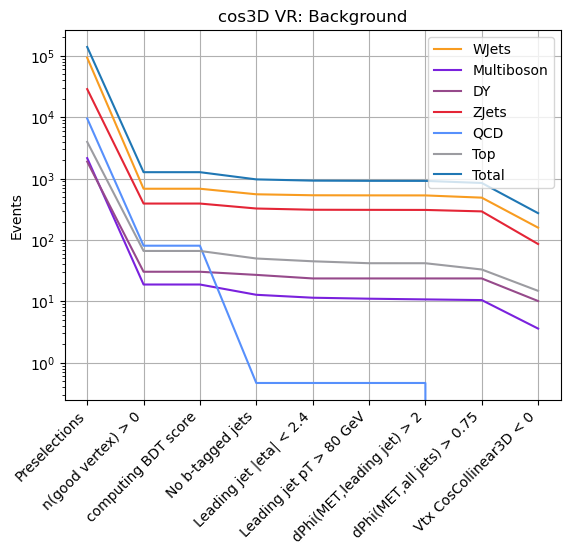

In [12]:
df = utils.get_bkg_cutflow_df(bkg_histo, 'cutflow_cts')

ptools.plot_bkg_efficiency(bkg_histo, df, doLog = True, ylabel = 'Events', title = 'cos3D VR: Background')

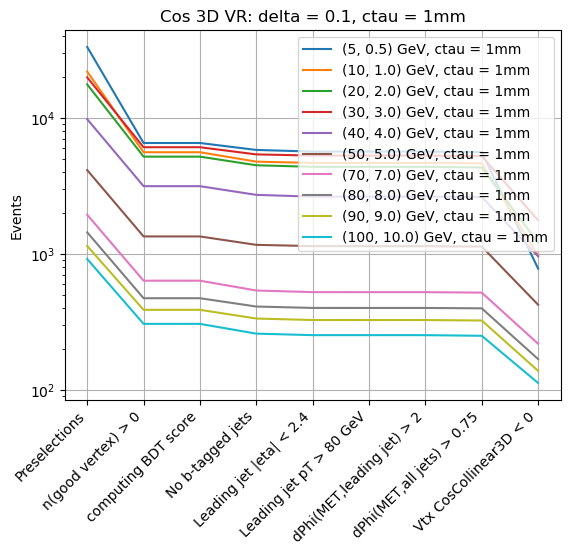

In [13]:
df = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')

m1s = [5, 10, 20, 30, 40, 50, 70, 80, 90, 100]
deltas = [0.1]
ctaus = [1]

title = f'Cos 3D VR: delta = {deltas[0]}, ctau = {ctaus[0]}mm'
ptools.plot_signal_efficiency(sig_histo, df, m1s, deltas, ctaus, doLog = True, ylabel = 'Events', title = title)

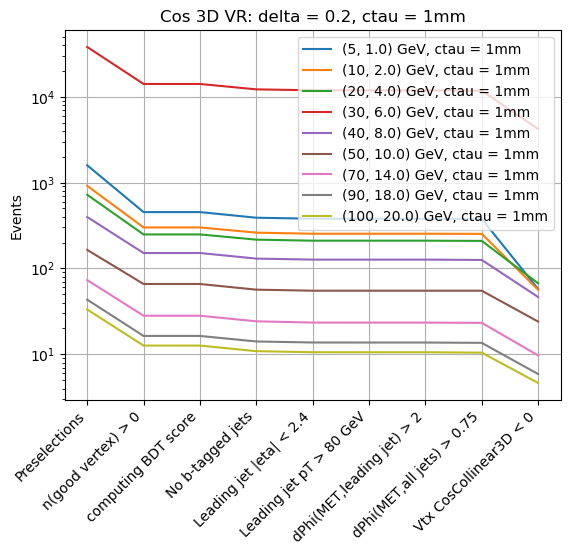

In [14]:
df = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')

m1s = [5, 10, 20, 30, 40, 50, 70, 80, 90, 100]
deltas = [0.2]
ctaus = [1]

title = f'Cos 3D VR: delta = {deltas[0]}, ctau = {ctaus[0]}mm'
ptools.plot_signal_efficiency(sig_histo, df, m1s, deltas, ctaus, doLog = True, ylabel = 'Events', title = title)

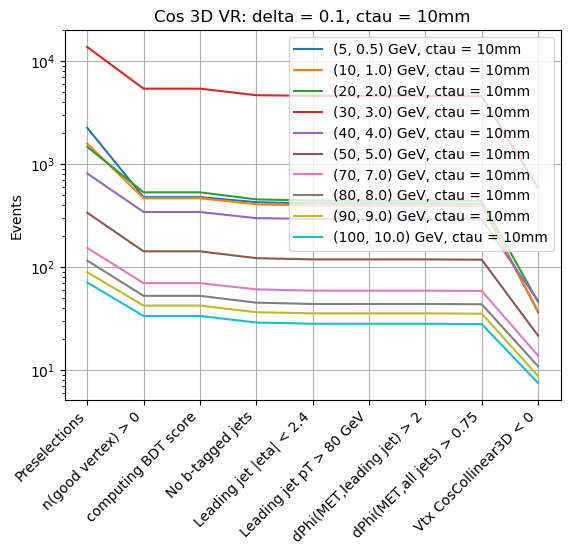

In [15]:
df = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')

m1s = [5, 10, 20, 30, 40, 50, 70, 80, 90, 100]
deltas = [0.1]
ctaus = [10]

title = f'Cos 3D VR: delta = {deltas[0]}, ctau = {ctaus[0]}mm'
ptools.plot_signal_efficiency(sig_histo, df, m1s, deltas, ctaus, doLog = True, ylabel = 'Events', title = title)

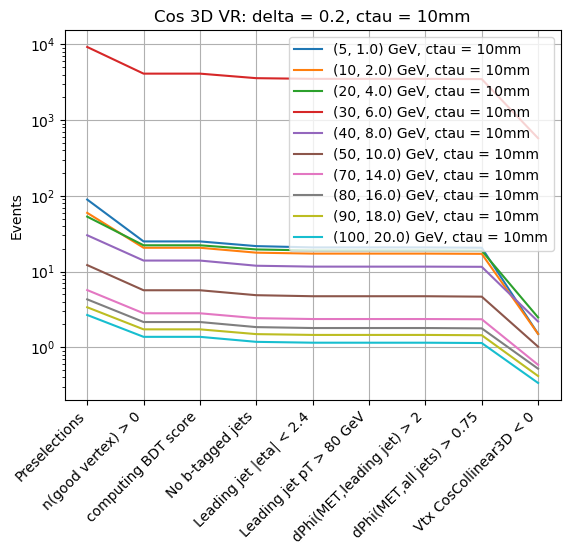

In [16]:
df = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')

m1s = [5, 10, 20, 30, 40, 50, 70, 80, 90, 100]
deltas = [0.2]
ctaus = [10]

title = f'Cos 3D VR: delta = {deltas[0]}, ctau = {ctaus[0]}mm'
ptools.plot_signal_efficiency(sig_histo, df, m1s, deltas, ctaus, doLog = True, ylabel = 'Events', title = title)

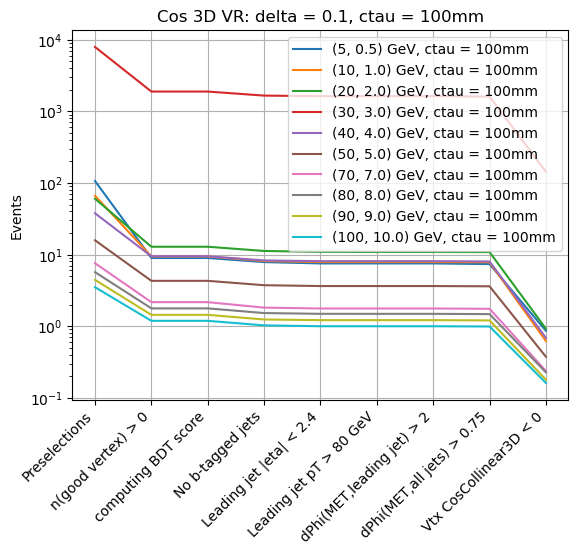

In [17]:
df = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')

m1s = [5, 10, 20, 30, 40, 50, 70, 80, 90, 100]
deltas = [0.1]
ctaus = [100]

title = f'Cos 3D VR: delta = {deltas[0]}, ctau = {ctaus[0]}mm'
ptools.plot_signal_efficiency(sig_histo, df, m1s, deltas, ctaus, doLog = True, ylabel = 'Events', title = title)

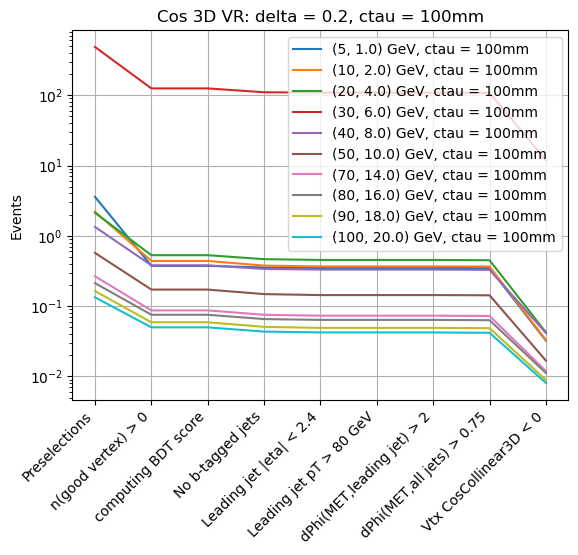

In [18]:
df = utils.get_signal_cutflow_dict(sig_histo, 'cutflow_cts')

m1s = [5, 10, 20, 30, 40, 50, 70, 80, 90, 100]
deltas = [0.2]
ctaus = [100]

title = f'Cos 3D VR: delta = {deltas[0]}, ctau = {ctaus[0]}mm'
ptools.plot_signal_efficiency(sig_histo, df, m1s, deltas, ctaus, doLog = True, ylabel = 'Events', title = title)

In [ ]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'cos_collinear3D',
    'cut': 'cut9',
}

style_dict = {
    'rebin': 20j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': "cos(collinear 3D)",   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, isLegacy = False)

# signal points
m1s = [20]
deltas = [0.1]
ctaus = [10]

# Plot for variables signal points
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            ptools.plot_signal_1D(ax, sig_histo, m1, delta, ctau, plot_dict, style_dict)

plt.title('After ISR Cut')
plt.legend()
plt.show()

/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


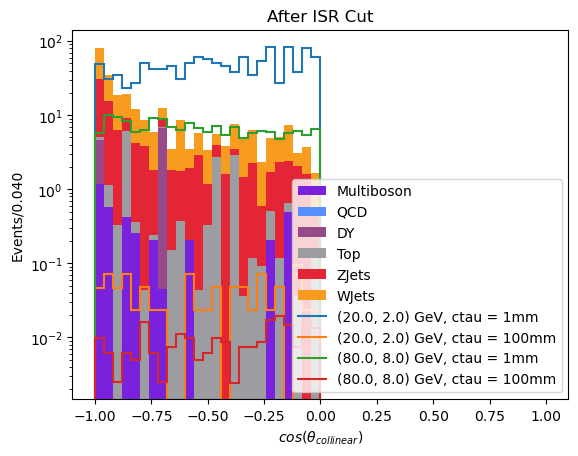

In [23]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'cos_collinear3D',
    'cut': 'cut10',
}

style_dict = {
    'rebin': 20j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, isLegacy = False)

# signal points
m1s = [20, 80]
deltas = [0.1]
ctaus = [1, 100]

# Plot for variables signal points
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            ptools.plot_signal_1D(ax, sig_histo, m1, delta, ctau, plot_dict, style_dict)

plt.title('After ISR Cut')
plt.legend()
plt.show()

/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


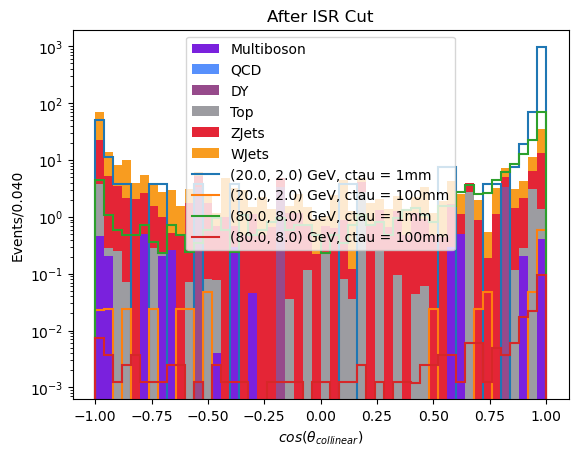

In [24]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'cos_collinear',
    'cut': 'cut10',
}

style_dict = {
    'rebin': 20j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, isLegacy = False)

# signal points
m1s = [20, 80]
deltas = [0.1]
ctaus = [1, 100]

# Plot for variables signal points
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            ptools.plot_signal_1D(ax, sig_histo, m1, delta, ctau, plot_dict, style_dict)

plt.title('After ISR Cut')
plt.legend()
plt.show()

/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))
/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/mplhep/utils.py:199: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


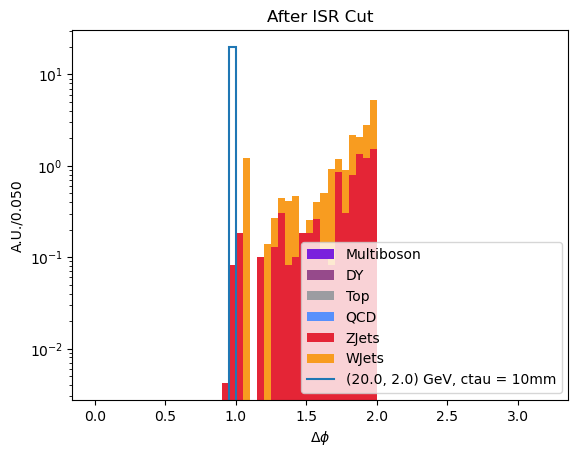

In [31]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'lead_jet_met_dPhi',
    'cut': 'cut8',
}

style_dict = {
    'rebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': True,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, isLegacy = False)

# signal points
m1s = [20]
deltas = [0.1]
ctaus = [10]

# Plot for variables signal points
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            ptools.plot_signal_1D(ax, sig_histo, m1, delta, ctau, plot_dict, style_dict)

plt.title('After ISR Cut')
plt.legend()
plt.show()

/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


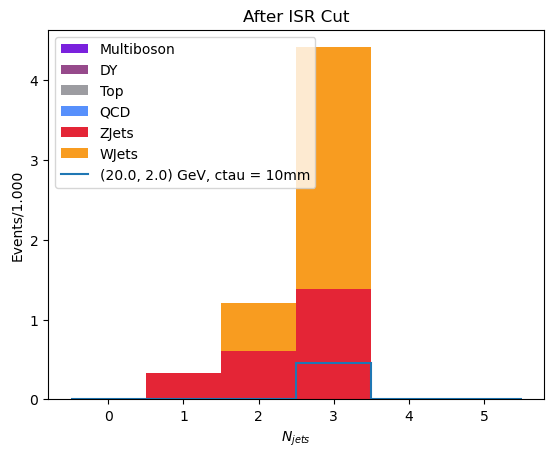

In [28]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'nJets',
    'cut': 'cut8',
}

style_dict = {
    'rebin': 1j,
    'xlim': [0,6],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': False, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, isLegacy = False)


# signal points
m1s = [20]
deltas = [0.1]
ctaus = [10]

# Plot for variables signal points
for m1 in m1s:
    for delta in deltas:
        for ctau in ctaus:
            ptools.plot_signal_1D(ax, sig_histo, m1, delta, ctau, plot_dict, style_dict)

plt.title('After ISR Cut')
plt.legend()
plt.show()

/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


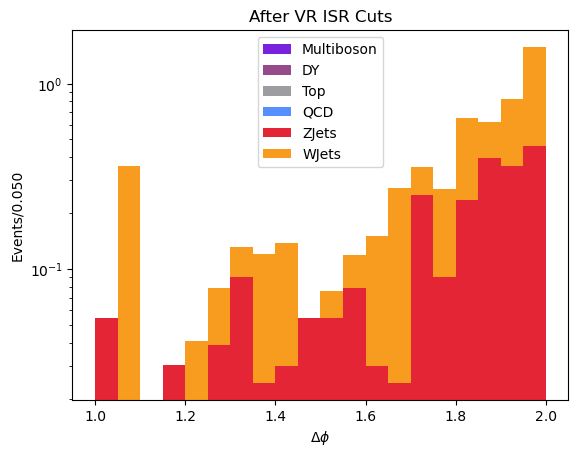

In [71]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'lead_jet_met_dPhi',
    'cut': 'cut8',
}

style_dict = {
    'rebin': 1j,
    'xlim': [1,2],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': None,    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, isLegacy = False)

plt.title('After VR ISR Cuts')
plt.legend()
plt.show()

/uscms/home/kyungmip/nobackup/miniconda3/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


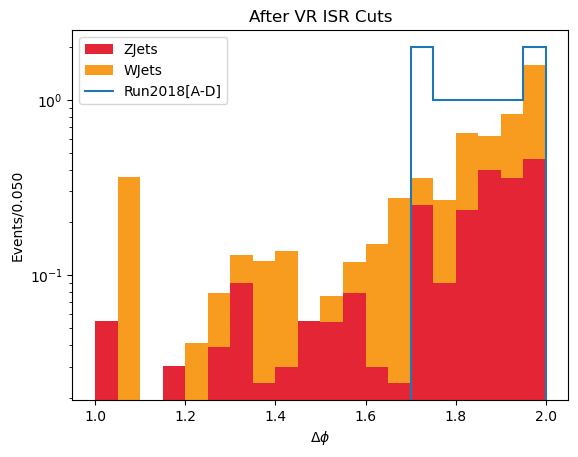

In [80]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'lead_jet_met_dPhi',
    'cut': 'cut8',
}

style_dict = {
    'rebin': 1j,
    'xlim': [1,2],     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, processes = ['WJets', 'ZJets'], isLegacy = False)

ptools.plot_data_1d(ax, data_histo, plot_dict, style_dict)

plt.title('After VR ISR Cuts')
plt.legend()
plt.show()

In [ ]:
fig, ax = plt.subplots()

# Plot settings
plot_dict = {
    'variable': 'nJets',
    'cut': 'cut8',
}

style_dict = {
    'rebin': 1j,
    'xlim': None,     # if None, the default will show up; otherwise give as a list, i.e. [0, 10]
    'doLogy': True, 
    'doLogx': False,
    'doDensity': False,
    'doYerr': False, 
    'xlabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Electron dxy'
    'ylabel': None,   # if None, the default will show up; otherwise give as a string, i.e. 'Efficiency'
    'label': 'Run2018[A-D]',    # if None, the default will show up; otherwise give as a string, i.e. 'Highest ctau signal samples'
    'flow': None,     # overflow
}

# bkg
ptools.plot_bkg_1d(ax, bkg_histo, plot_dict, style_dict, processes = ['WJets', 'ZJets'], isLegacy = False)

ptools.plot_data_1d(ax, data_histo, plot_dict, style_dict)

plt.title('After VR ISR Cuts')
plt.legend()
plt.show()

## Old

In [30]:
def plot_signal_efficiency(sig_histo, df_cutflow, df_purity, m1s, deltas, ctaus, label, multPurity=False, doLog = True, ylabel = '', title = ''):
    cuts = utils.get_signal_list_of_cuts(sig_histo)

    m1_list = []
    for point in df_cutflow.index.values:
        sig_dict = ptools.signalPoint(point)
        m1 = int(sig_dict['m1'])
        m1_list.append(m1)

    df_cutflow['m1'] = m1_list
    df_cutflow = df_cutflow.sort_values(by=['m1']) # sort by m1
    df_cutflow.pop('m1')

    df_purity['m1'] = m1_list
    df_purity = df_purity.sort_values(by=['m1']) # sort by m1
    df_purity.pop('m1')
        
    for point in df_cutflow.index.values:
        sig_dict = ptools.signalPoint(point)
        m1 = int(sig_dict['m1'])
        delta = sig_dict['delta']
        dmchi = sig_dict['dmchi']
        ctau = int(sig_dict['ctau'])
        
        if (m1 in m1s) and (delta in deltas):
            if ctau in ctaus:
                if multPurity:
                    plt.plot(cuts, df_cutflow.loc[point]*df_purity.loc[point], label=label)
                else:
                    plt.plot(cuts, df_cutflow.loc[point], label=label)
                #print(df_cutflow.loc[point])
                #print(df_purity.loc[point])
                #print(df_cutflow.loc[point]*df_purity.loc[point])

    plt.grid()

    if doLog:
        plt.yscale('log')
    
    plt.ylabel(ylabel)
    plt.title(title)
    
    plt.xticks(ticks = np.arange(len(cuts)), labels = cuts, rotation = 45, ha = 'right')
    
    plt.legend()

### Compare efficiency at Preselection step across different signal samples

#### ctau = 1mm

In [23]:
si = utils.get_signal_point_dict(sig_histo_v2)

ct = 1.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v2, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v2 = df.sort_values(by=['m1']) # sort by m1
df_v2

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-1,0.014782,5.0,0.1,1.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1,0.015928,10.0,0.1,1.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1,0.018942,20.0,0.1,1.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-1,0.023214,30.0,0.1,1.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1,0.030555,40.0,0.1,1.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-1,0.036318,50.0,0.1,1.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-1,0.043559,60.0,0.1,1.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-1,0.051428,70.0,0.1,1.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-1,0.058112,80.0,0.1,1.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-1,0.066110,90.0,0.1,1.0


In [24]:
si = utils.get_signal_point_dict(sig_histo_v4)

ct = 1.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v4, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v4 = df.sort_values(by=['m1']) # sort by m1
df_v4

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-1,0.013839,5.0,0.1,1.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1,0.015441,10.0,0.1,1.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1,0.018915,20.0,0.1,1.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-1,0.023415,30.0,0.1,1.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1,0.030884,40.0,0.1,1.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-1,0.037325,50.0,0.1,1.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-1,0.044809,60.0,0.1,1.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-1,0.053240,70.0,0.1,1.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-1,0.060691,80.0,0.1,1.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-1,0.069469,90.0,0.1,1.0


In [25]:
si = utils.get_signal_point_dict(sig_histo_v9)

ct = 1.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v9, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v9 = df.sort_values(by=['m1']) # sort by m1
df_v9

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-1,0.007798,5.0,0.1,1.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-1,0.009067,10.0,0.1,1.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-1,0.011389,20.0,0.1,1.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-1,0.014386,30.0,0.1,1.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-1,0.019192,40.0,0.1,1.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-1,0.023795,50.0,0.1,1.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-1,0.029259,60.0,0.1,1.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-1,0.035247,70.0,0.1,1.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-1,0.040690,80.0,0.1,1.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-1,0.047846,90.0,0.1,1.0


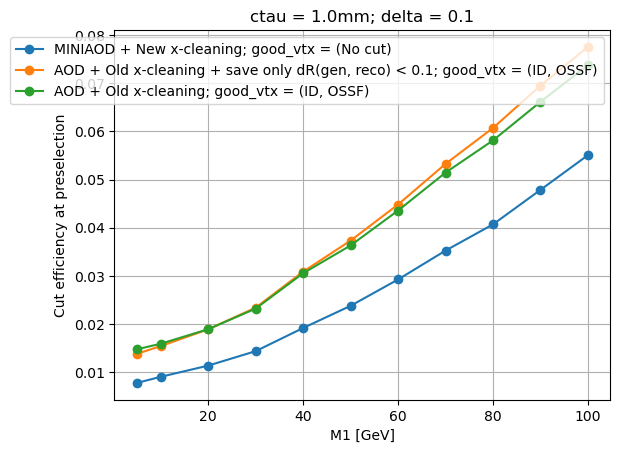

In [26]:
plt.plot(df_v9.iloc[:,1], df_v9.iloc[:,0], '-o', label='MINIAOD + New x-cleaning; good_vtx = (No cut)')
plt.plot(df_v4.iloc[:,1], df_v4.iloc[:,0], '-o', label='AOD + Old x-cleaning + save only dR(gen, reco) < 0.1; good_vtx = (ID, OSSF)')
plt.plot(df_v2.iloc[:,1], df_v2.iloc[:,0], '-o', label='AOD + Old x-cleaning; good_vtx = (ID, OSSF)')

plt.xlabel('M1 [GeV]')
plt.ylabel('Cut efficiency at preselection')
plt.title(f'ctau = {ct}mm; delta = {delta}')

plt.legend()

plt.grid()

#### ctau = 10mm

In [27]:
si = utils.get_signal_point_dict(sig_histo_v2)

ct = 10.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v2, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v2 = df.sort_values(by=['m1']) # sort by m1
df_v2

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10,0.010676,5.0,0.1,10.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10,0.012434,10.0,0.1,10.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10,0.016286,20.0,0.1,10.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-10,0.020128,30.0,0.1,10.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10,0.025875,40.0,0.1,10.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-10,0.032445,50.0,0.1,10.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-10,0.039166,60.0,0.1,10.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-10,0.045232,70.0,0.1,10.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-10,0.052317,80.0,0.1,10.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-10,0.058330,90.0,0.1,10.0


In [28]:
si = utils.get_signal_point_dict(sig_histo_v9_1)

ct = 10.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v9_1, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v9_1 = df.sort_values(by=['m1']) # sort by m1
df_v9_1

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10,0.003915,5.0,0.1,10.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10,0.005471,10.0,0.1,10.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10,0.008252,20.0,0.1,10.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-10,0.010654,30.0,0.1,10.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10,0.014084,40.0,0.1,10.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-10,0.018309,50.0,0.1,10.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-10,0.022329,60.0,0.1,10.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-10,0.027153,70.0,0.1,10.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-10,0.031853,80.0,0.1,10.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-10,0.036601,90.0,0.1,10.0


In [29]:
si = utils.get_signal_point_dict(sig_histo_v9)

ct = 10.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v9, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v9 = df.sort_values(by=['m1']) # sort by m1
df_v9

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-10,0.003915,5.0,0.1,10.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-10,0.005471,10.0,0.1,10.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-10,0.008252,20.0,0.1,10.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-10,0.010654,30.0,0.1,10.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-10,0.014084,40.0,0.1,10.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-10,0.018309,50.0,0.1,10.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-10,0.022329,60.0,0.1,10.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-10,0.027153,70.0,0.1,10.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-10,0.031853,80.0,0.1,10.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-10,0.036601,90.0,0.1,10.0


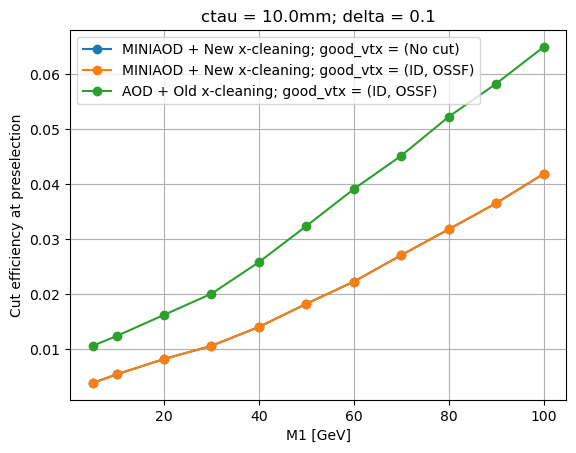

In [30]:
plt.plot(df_v9.iloc[:,1], df_v9.iloc[:,0], '-o', label='MINIAOD + New x-cleaning; good_vtx = (No cut)')
plt.plot(df_v9_1.iloc[:,1], df_v9_1.iloc[:,0], '-o', label='MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)')
plt.plot(df_v2.iloc[:,1], df_v2.iloc[:,0], '-o', label='AOD + Old x-cleaning; good_vtx = (ID, OSSF)')

plt.xlabel('M1 [GeV]')
plt.ylabel('Cut efficiency at preselection')
plt.title(f'ctau = {ct}mm; delta = {delta}')

plt.legend()

plt.grid()

#### ctau = 100mm

In [31]:
si = utils.get_signal_point_dict(sig_histo_v2)

ct = 100.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v2, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v2 = df.sort_values(by=['m1']) # sort by m1
df_v2

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100,0.007306,5.0,0.1,100.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100,0.008039,10.0,0.1,100.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100,0.010649,20.0,0.1,100.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-100,0.013536,30.0,0.1,100.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100,0.017664,40.0,0.1,100.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-100,0.022522,50.0,0.1,100.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-100,0.027190,60.0,0.1,100.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-100,0.032810,70.0,0.1,100.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-100,0.036959,80.0,0.1,100.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-100,0.041559,90.0,0.1,100.0


In [32]:
si = utils.get_signal_point_dict(sig_histo_v9_1)

ct = 100.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v9_1, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v9_1 = df.sort_values(by=['m1']) # sort by m1
df_v9_1

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100,0.001770,5.0,0.1,100.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100,0.002227,10.0,0.1,100.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100,0.003310,20.0,0.1,100.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-100,0.004578,30.0,0.1,100.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100,0.006403,40.0,0.1,100.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-100,0.008484,50.0,0.1,100.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-100,0.010628,60.0,0.1,100.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-100,0.013246,70.0,0.1,100.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-100,0.015500,80.0,0.1,100.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-100,0.018018,90.0,0.1,100.0


In [33]:
si = utils.get_signal_point_dict(sig_histo_v9)

ct = 100.0
delta = 0.1

points = (si["ctau"] == ct) & (si["delta"] == delta)

table = utils.get_signal_cutflow_dict(sig_histo_v9, 'cutflow')

df = table.loc[list(si[points].name)]
df = pd.DataFrame(df.iloc[:, 0])

m1_list = []
delta_list = []
ctau_list = []

for point in df.index.values:
    sig_dict = ptools.signalPoint(point)
    m1_list.append(sig_dict['m1'])
    delta_list.append(sig_dict['delta'])
    ctau_list.append(sig_dict['ctau'])

df['m1'] = m1_list
df['delta'] = delta_list
df['ctau'] = ctau_list

df_v9 = df.sort_values(by=['m1']) # sort by m1
df_v9

,Preselections,m1,delta,ctau
sig_2018_Mchi-5p25_dMchi-0p5_ctau-100,0.001770,5.0,0.1,100.0
sig_2018_Mchi-10p5_dMchi-1p0_ctau-100,0.002227,10.0,0.1,100.0
sig_2018_Mchi-21p0_dMchi-2p0_ctau-100,0.003310,20.0,0.1,100.0
sig_2018_Mchi-31p5_dMchi-3p0_ctau-100,0.004578,30.0,0.1,100.0
sig_2018_Mchi-42p0_dMchi-4p0_ctau-100,0.006403,40.0,0.1,100.0
sig_2018_Mchi-52p5_dMchi-5p0_ctau-100,0.008484,50.0,0.1,100.0
sig_2018_Mchi-63p0_dMchi-6p0_ctau-100,0.010628,60.0,0.1,100.0
sig_2018_Mchi-73p5_dMchi-7p0_ctau-100,0.013246,70.0,0.1,100.0
sig_2018_Mchi-84p0_dMchi-8p0_ctau-100,0.015500,80.0,0.1,100.0
sig_2018_Mchi-94p5_dMchi-9p0_ctau-100,0.018018,90.0,0.1,100.0


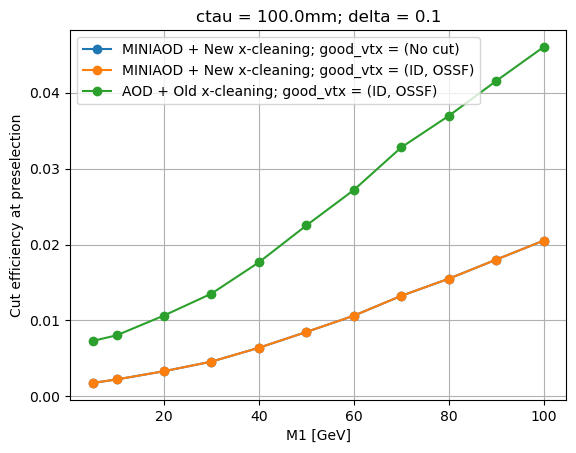

In [34]:
plt.plot(df_v9.iloc[:,1], df_v9.iloc[:,0], '-o', label='MINIAOD + New x-cleaning; good_vtx = (No cut)')
plt.plot(df_v9_1.iloc[:,1], df_v9_1.iloc[:,0], '-o', label='MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)')
plt.plot(df_v2.iloc[:,1], df_v2.iloc[:,0], '-o', label='AOD + Old x-cleaning; good_vtx = (ID, OSSF)')

plt.xlabel('M1 [GeV]')
plt.ylabel('Cut efficiency at preselection')
plt.title(f'ctau = {ct}mm; delta = {delta}')

plt.legend()

plt.grid()

### Plot Efficiency

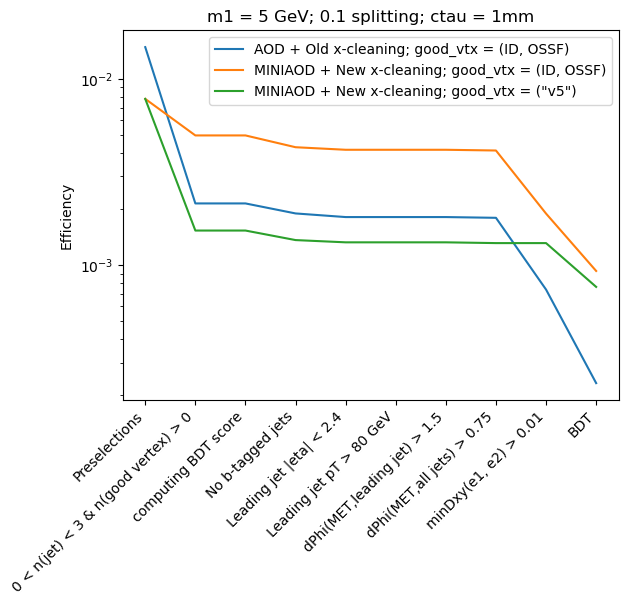

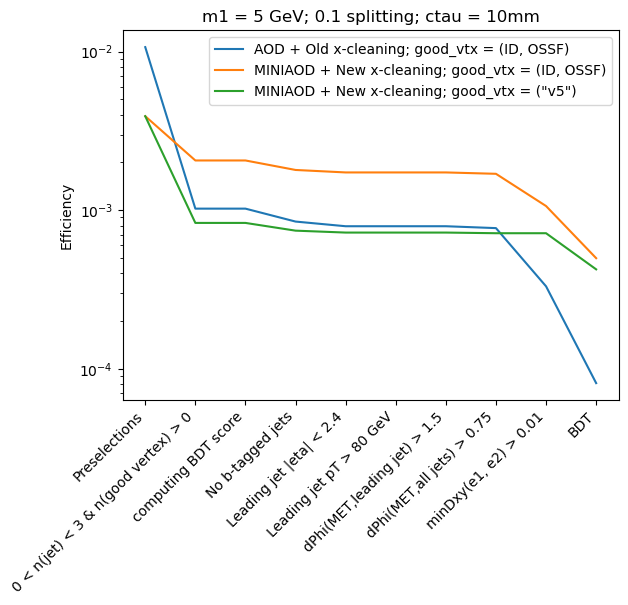

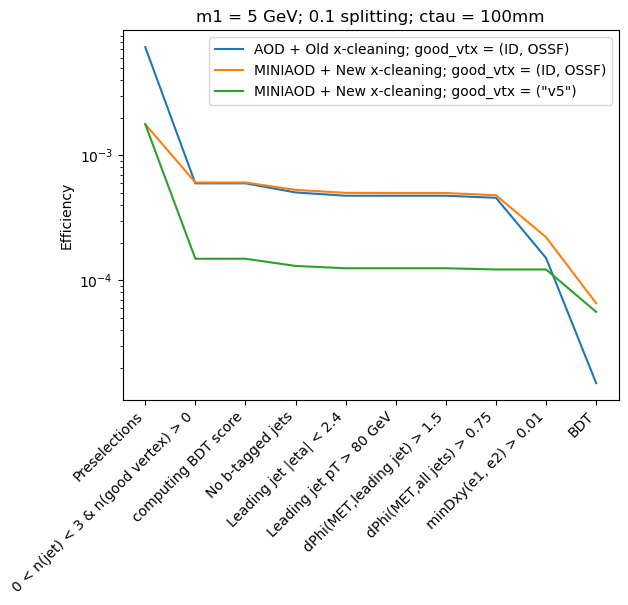

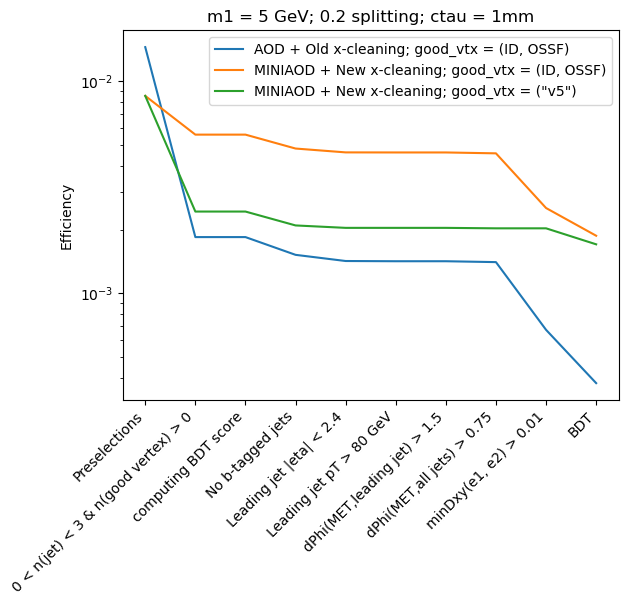

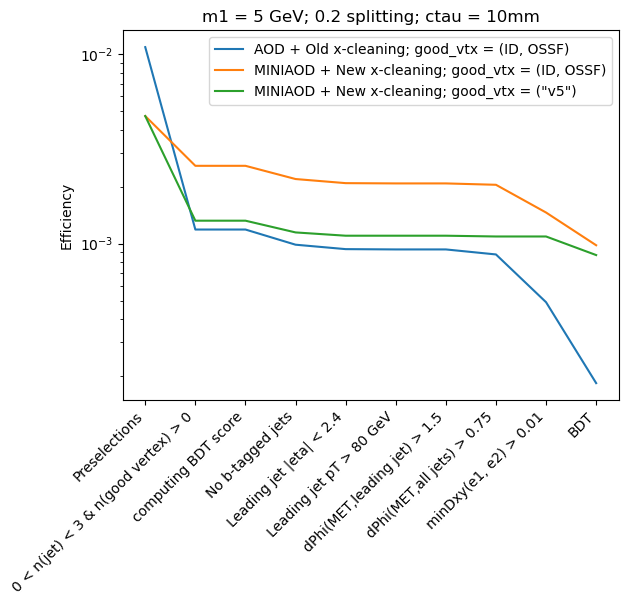

...

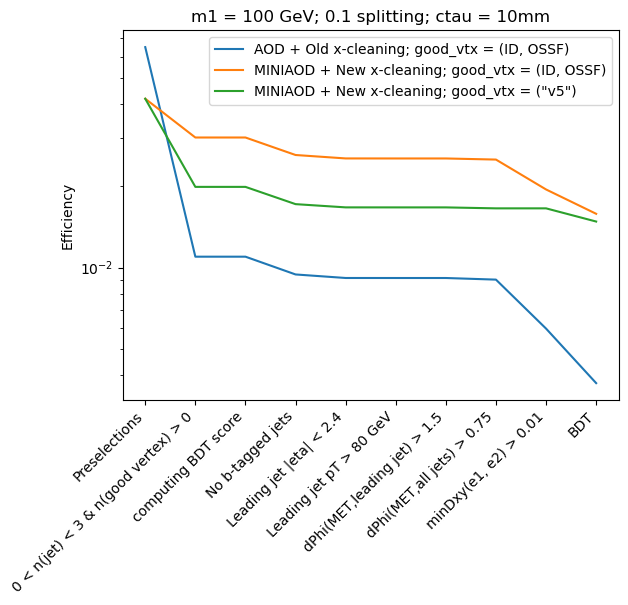

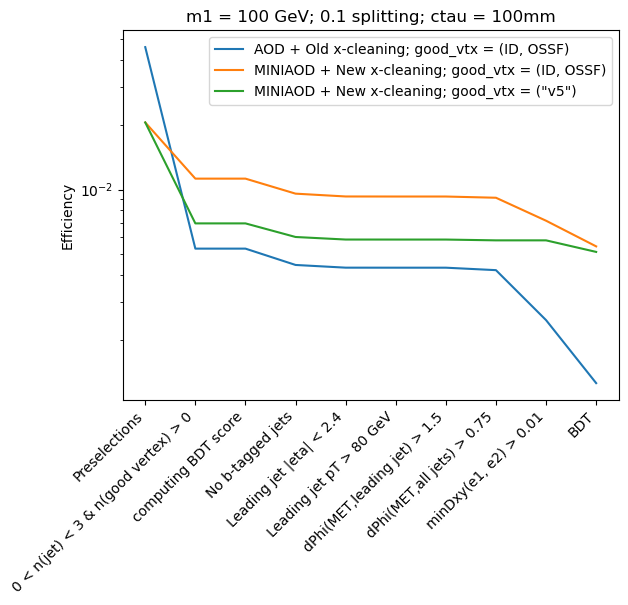

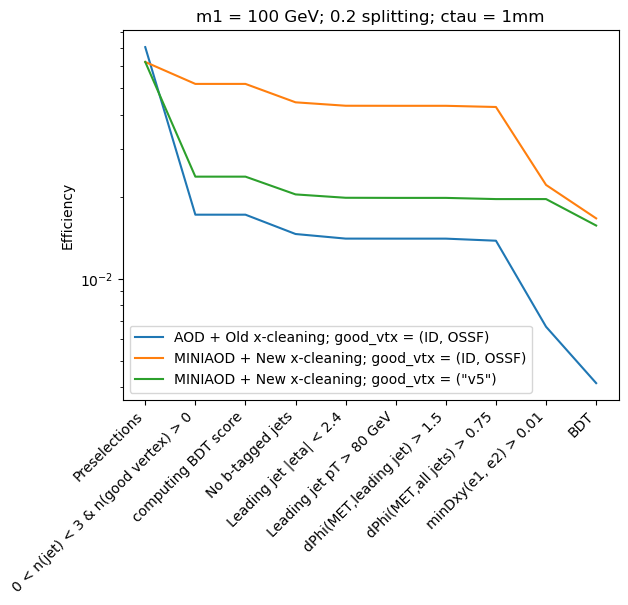

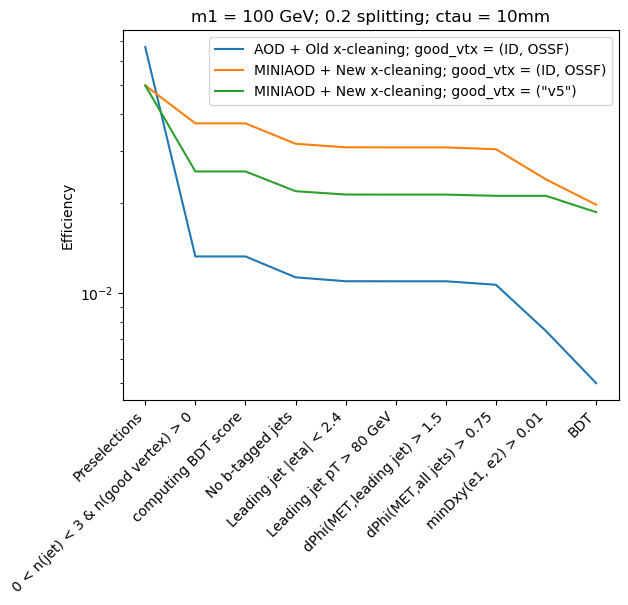

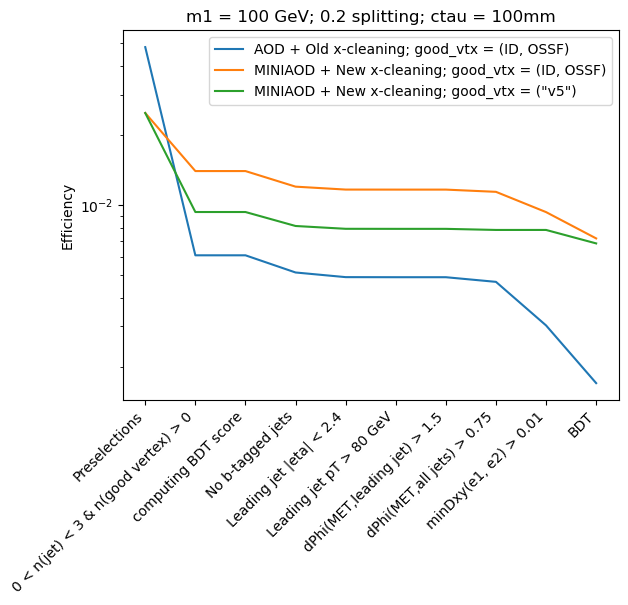

In [31]:
m1_list = [5, 10, 20, 30, 40, 50, 70, 90, 100]
delta_list = [0.1, 0.2]
ctau_list = [1, 10, 100]

for m1 in m1_list:
    for delta in delta_list:
        for ctau in ctau_list:
            title = f'm1 = {m1} GeV; {delta} splitting; ctau = {ctau}mm'
            m1s = []
            deltas = []
            ctaus = []

            m1s.append(m1)
            deltas.append(delta)
            ctaus.append(ctau)

            ylabel = 'Efficiency'

            plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, df_purity_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
            plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, df_purity_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
            plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, df_purity_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("v5")', doLog = True, ylabel = ylabel, title = title)
            
            plt.grid()
            plt.show()

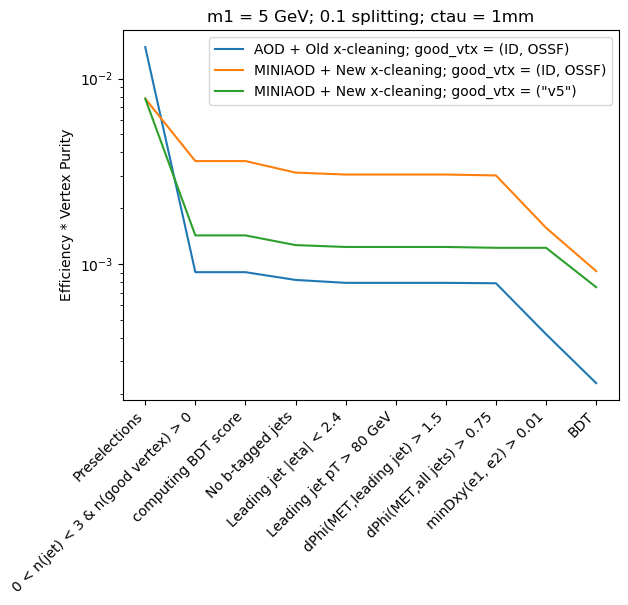

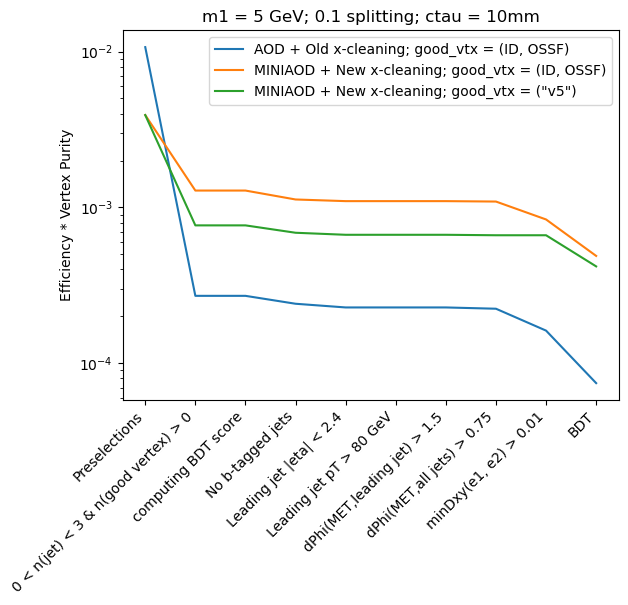

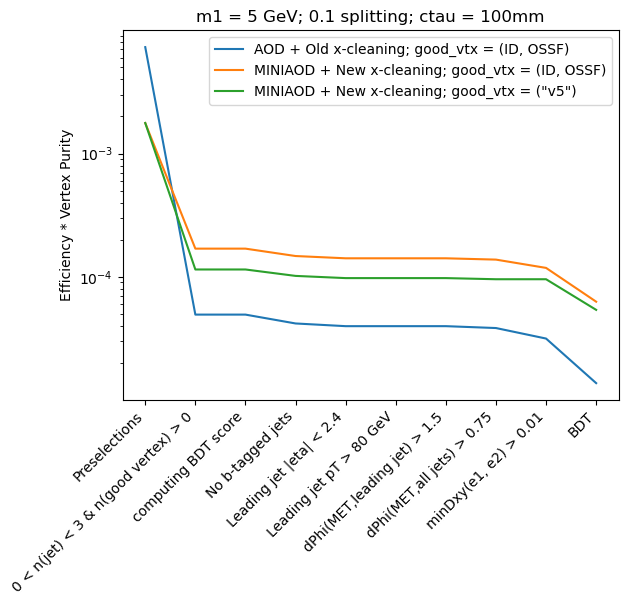

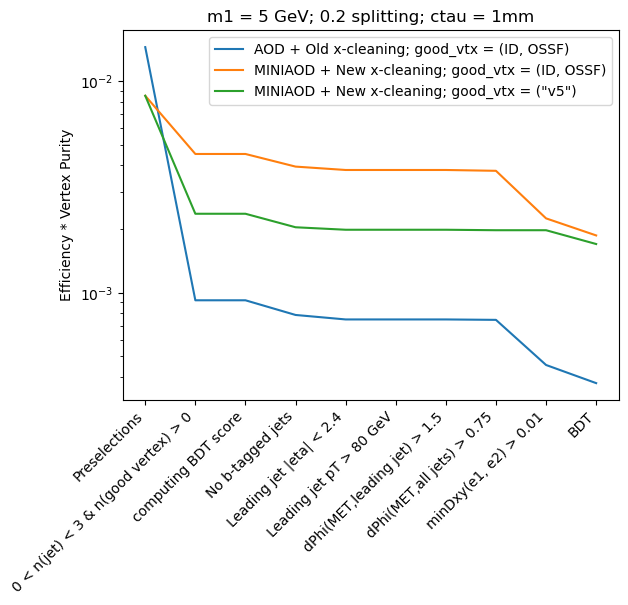

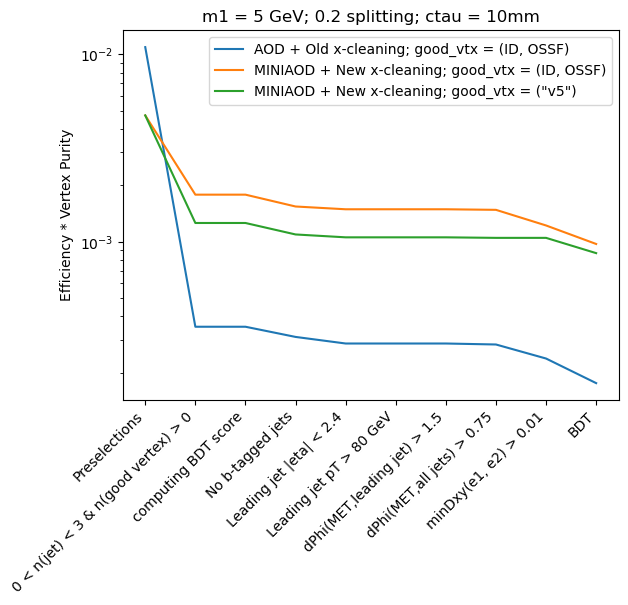

...

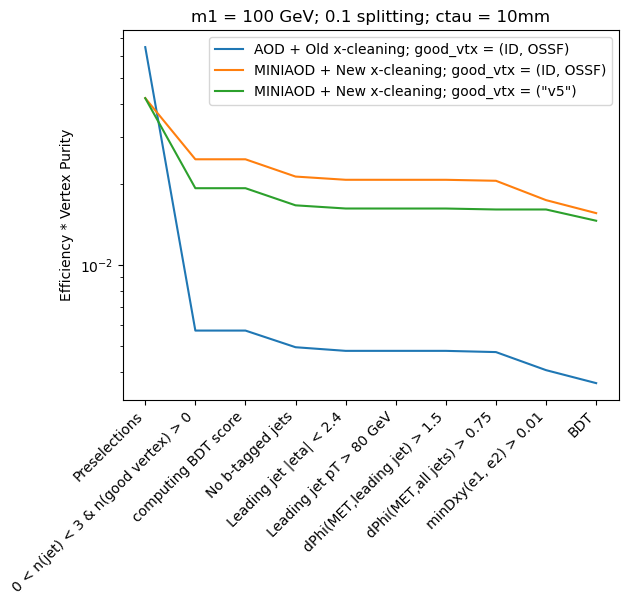

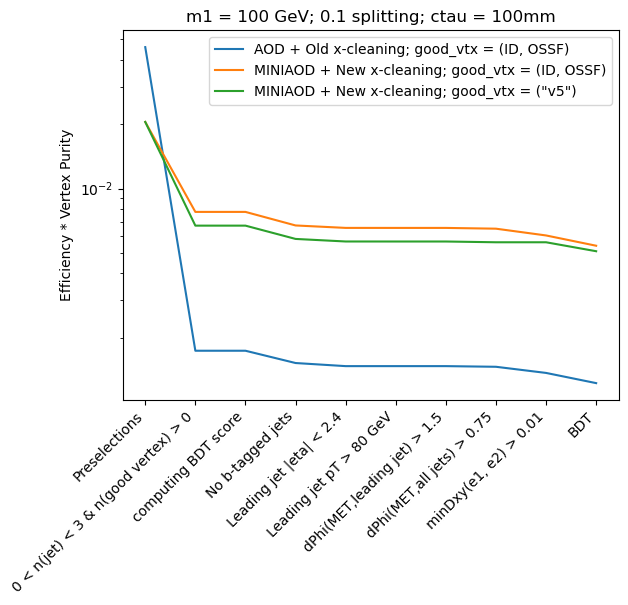

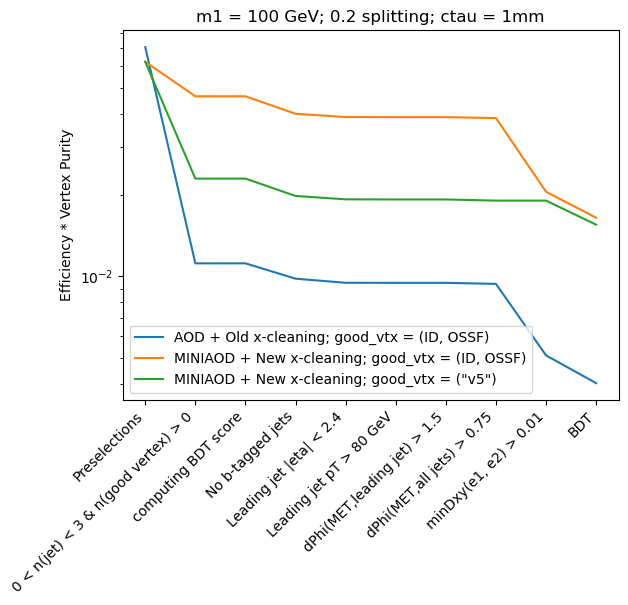

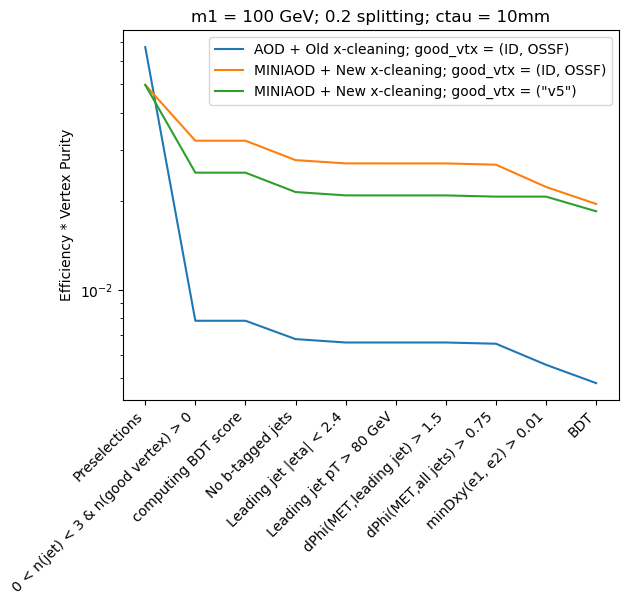

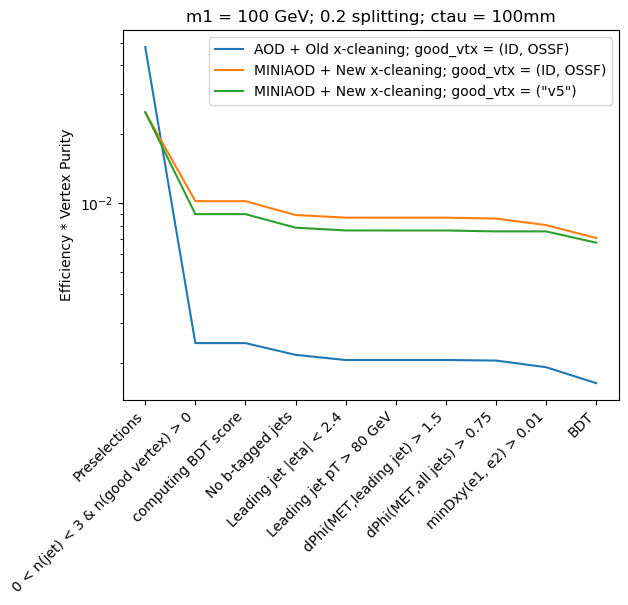

In [32]:
m1_list = [5, 10, 20, 30, 40, 50, 70, 90, 100]
delta_list = [0.1, 0.2]
ctau_list = [1, 10, 100]

multPurity = True

for m1 in m1_list:
    for delta in delta_list:
        for ctau in ctau_list:
            title = f'm1 = {m1} GeV; {delta} splitting; ctau = {ctau}mm'
            m1s = []
            deltas = []
            ctaus = []

            m1s.append(m1)
            deltas.append(delta)
            ctaus.append(ctau)

            ylabel = 'Efficiency * Vertex Purity'

            plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, df_purity_v2, m1s, deltas, ctaus, multPurity = multPurity, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
            plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, df_purity_v9_1, m1s, deltas, ctaus, multPurity = multPurity, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
            plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, df_purity_v9_2, m1s, deltas, ctaus, multPurity = multPurity, label = 'MINIAOD + New x-cleaning; good_vtx = ("v5")', doLog = True, ylabel = ylabel, title = title)
            
            plt.grid()
            plt.show()

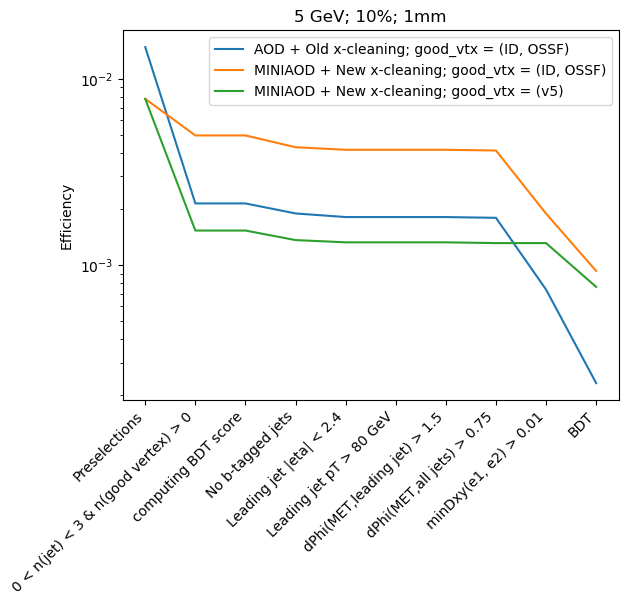

In [41]:
m1s = [5]
deltas = [0.1]
ctaus = [1]

title = '5 GeV; 10%; 1mm'
ylabel = 'Efficiency'

plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v4, df_cutflow_v4, m1s, deltas, ctaus, label = 'signal v4', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v5, df_cutflow_v5, m1s, deltas, ctaus, label = 'AOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v9, df_cutflow_v9, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("None")', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (v5)', doLog = True, ylabel = ylabel, title = title)


plt.grid()
plt.show()

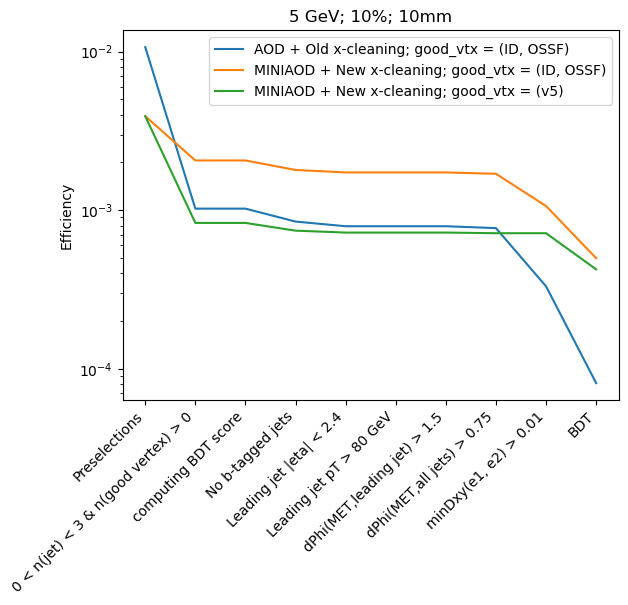

In [42]:
m1s = [5]
deltas = [0.1]
ctaus = [10]

title = '5 GeV; 10%; 10mm'
ylabel = 'Efficiency'

plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v4, df_cutflow_v4, m1s, deltas, ctaus, label = 'signal v4', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v5, df_cutflow_v5, m1s, deltas, ctaus, label = 'AOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v9, df_cutflow_v9, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("None")', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (v5)', doLog = True, ylabel = ylabel, title = title)

plt.grid()
plt.show()

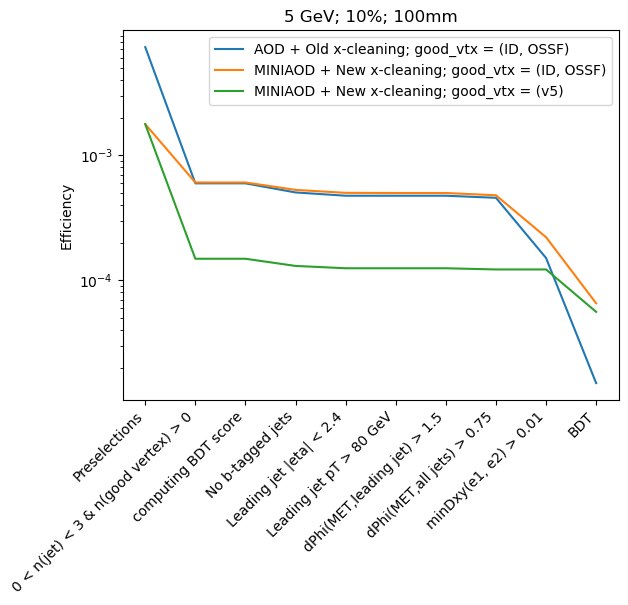

In [43]:
m1s = [5]
deltas = [0.1]
ctaus = [100]

title = '5 GeV; 10%; 100mm'
ylabel = 'Efficiency'

plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v4, df_cutflow_v4, m1s, deltas, ctaus, label = 'signal v4', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v5, df_cutflow_v5, m1s, deltas, ctaus, label = 'AOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v9, df_cutflow_v9, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("None")', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (v5)', doLog = True, ylabel = ylabel, title = title)

plt.grid()
plt.show()

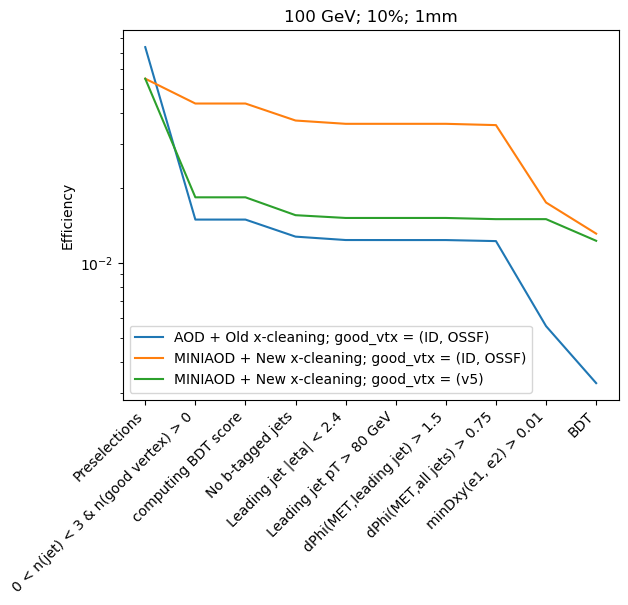

In [44]:
m1s = [100]
deltas = [0.1]
ctaus = [1]

title = '100 GeV; 10%; 1mm'
ylabel = 'Efficiency'

plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v4, df_cutflow_v4, m1s, deltas, ctaus, label = 'signal v4', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v5, df_cutflow_v5, m1s, deltas, ctaus, label = 'AOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v9, df_cutflow_v9, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("None")', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (v5)', doLog = True, ylabel = ylabel, title = title)

plt.grid()
plt.show()

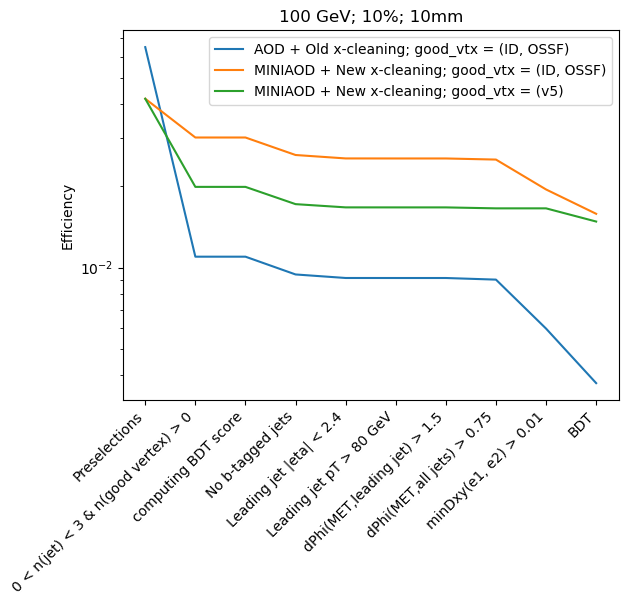

In [45]:
m1s = [100]
deltas = [0.1]
ctaus = [10]

title = '100 GeV; 10%; 10mm'
ylabel = 'Efficiency'

plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v4, df_cutflow_v4, m1s, deltas, ctaus, label = 'signal v4', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v5, df_cutflow_v5, m1s, deltas, ctaus, label = 'AOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v9, df_cutflow_v9, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("None")', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (v5)', doLog = True, ylabel = ylabel, title = title)

plt.grid()
plt.show()

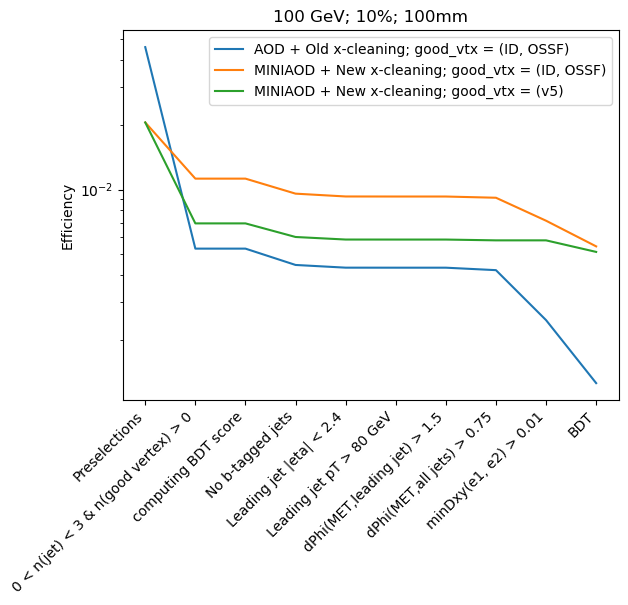

In [46]:
m1s = [100]
deltas = [0.1]
ctaus = [100]

title = '100 GeV; 10%; 100mm'
ylabel = 'Efficiency'

plot_signal_efficiency(sig_histo_v2, df_cutflow_v2, m1s, deltas, ctaus, label = 'AOD + Old x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v4, df_cutflow_v4, m1s, deltas, ctaus, label = 'signal v4', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v5, df_cutflow_v5, m1s, deltas, ctaus, label = 'AOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
#plot_signal_efficiency(sig_histo_v9, df_cutflow_v9, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = ("None")', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_1, df_cutflow_v9_1, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (ID, OSSF)', doLog = True, ylabel = ylabel, title = title)
plot_signal_efficiency(sig_histo_v9_2, df_cutflow_v9_2, m1s, deltas, ctaus, label = 'MINIAOD + New x-cleaning; good_vtx = (v5)', doLog = True, ylabel = ylabel, title = title)

plt.grid()
plt.show()